In [1]:
import numpy as np
import gym
import matplotlib.pyplot as plt
import vizdoomgym

import dataset #my file
import vae #my file
import lstm #my file
import parameters #my file
import lstm_doom_env #my file

from PIL import Image 

/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/ten

Instructions for updating:
non-resource variables are not supported in the long term


/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/luca/anaconda3/envs/drl/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/luca/anaconda3/envs/drl/lib/python

In [2]:
# Init
env = gym.make('VizdoomTakeCover-v0')
obs = env.reset()
#info_env = get_info_from_env(env)
dataset = dataset.Dataset(env) 
vae = vae.VAE(dataset)
vae.load_json()
#print("Creating dataset!")

print("Loading dataset!")
dataset.load_dataset(complete=True)

lstm = lstm.LSTM()
lstm.load_json()

learned_env = lstm_doom_env.DOOM_LSTM_ENV(vae)

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Use keras.layers.dense instead.


Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Model loaded!
Loading dataset!
len(self.encoded_frame_dataset):  500000
Frames Dataset size:  (500000, 64, 64, 3)
Encoded Frame Dataset size:  (500000, 64)
Action Dataset size:  (500000,)
Reset Dataset size:  (500000,)
Lstm Batch Size :  10
Num batches:  100
Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Session Started!
<tf.Variable 'lstm_unroll/lstm_cell/kernel:0' shape=(1090, 4096) dtype=float32_ref>
<tf.Variable 'lstm_unroll/lstm_cell/bias:0' shape=(4096,) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_w:0' shape=(1024, 961) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_b:0' shape=(961,) dtype=float32_ref>
Model loaded!
Session Started!
<tf.Variable 'lstm_unroll/lstm_cell/kernel:0' shape=(1090, 4096) dtype=float32_ref>
<tf.Variable 'lstm_unroll/lstm_cell/bias:0' shape=(4096,) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_w:0' shape=(1024, 961) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_b:0' shape=(961,) dtype=float32_ref>


In [3]:
print("dataset_size: ",dataset.dataset_size)
print("chunck_size: ",dataset.chunck_size)
print("lstm_batch_size: ",dataset.lstm_batch_size)
print("num_batches: ",(dataset.dataset_size/dataset.chunck_size)/dataset.lstm_batch_size)

dataset_size:  500000
chunck_size:  500
lstm_batch_size:  10
num_batches:  100.0


In [4]:
#get batches from dataset 
batch_encoded_frames,batch_actions,batch_reset = dataset.split_dataset_into_batches()

In [5]:
batch_encoded_frames.shape

(100, 10, 500, 64)

In [6]:
learned_env = lstm_doom_env.DOOM_LSTM_ENV(vae)


Session Started!
<tf.Variable 'lstm_unroll/lstm_cell/kernel:0' shape=(1090, 4096) dtype=float32_ref>
<tf.Variable 'lstm_unroll/lstm_cell/bias:0' shape=(4096,) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_w:0' shape=(1024, 961) dtype=float32_ref>
<tf.Variable 'lstm_activation_function/rnn_output_b:0' shape=(961,) dtype=float32_ref>


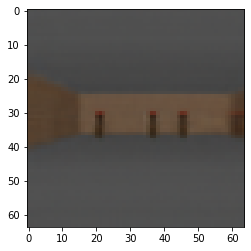

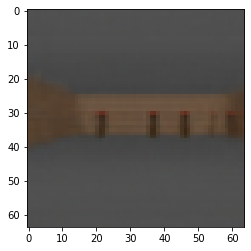

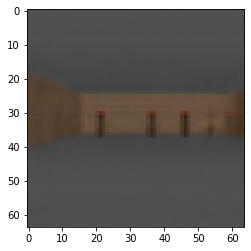

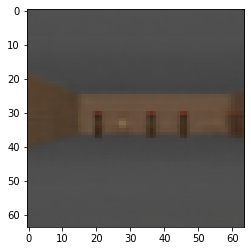

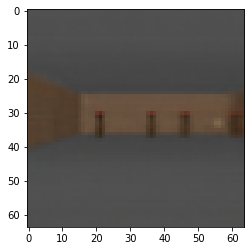

...

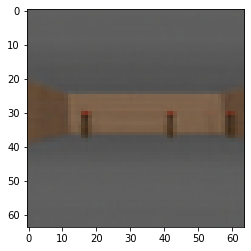

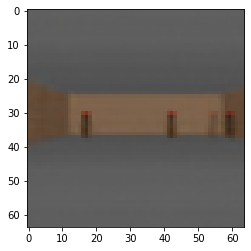

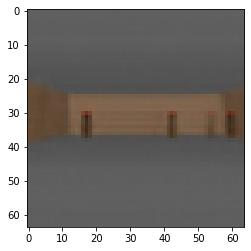

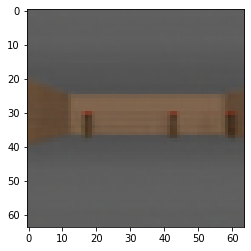

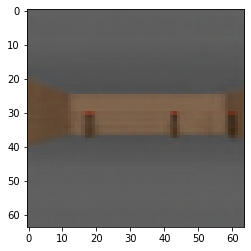

In [10]:
# VERA SEQUENZA
new_state,reward,done = learned_env.step(batch_encoded_frames[0][0][250],batch_actions[0][0][250],batch_reset[0][0][250])

for i in range(300):
    decoded = vae.decode_latent_vec(batch_encoded_frames[0][0][i])
    choosed_img = vae.post_process_frame(decoded)
    imgplot = plt.imshow(choosed_img)
    plt.show()
    if done:
        print("MORTO")
    i+=1

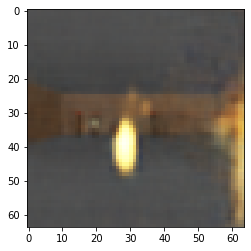

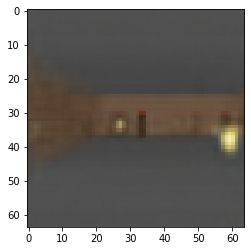

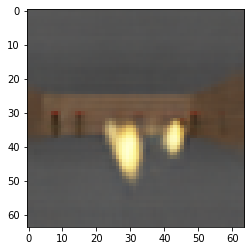

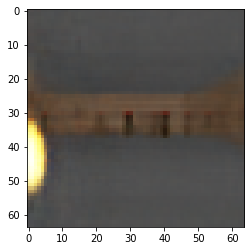

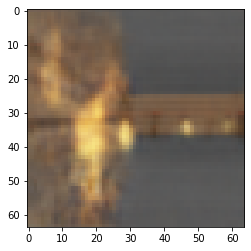

...

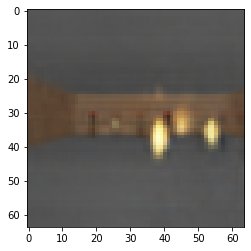

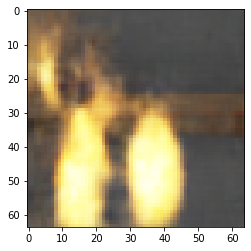

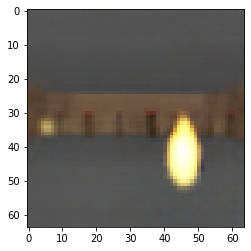

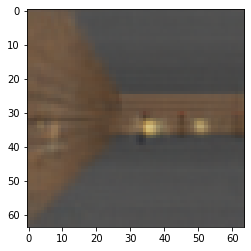

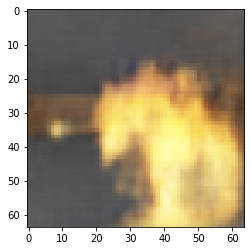

MORTO


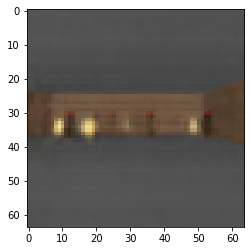

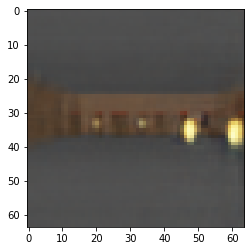

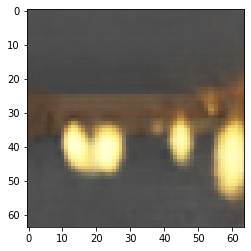

MORTO


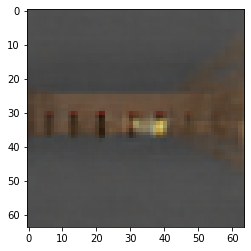

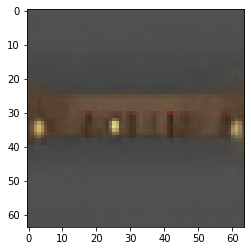

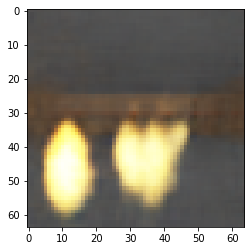

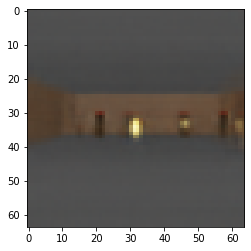

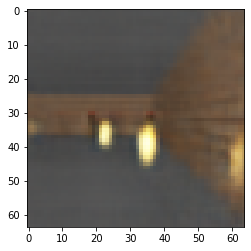

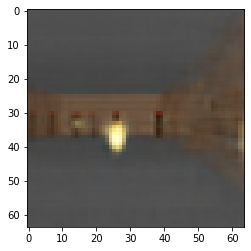

MORTO


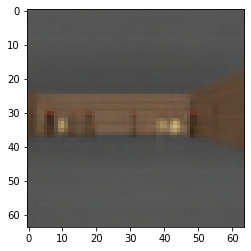

MORTO


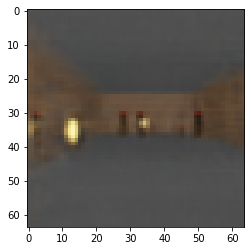

MORTO


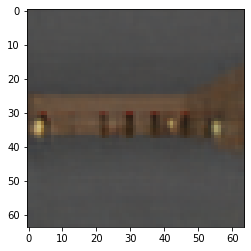

MORTO


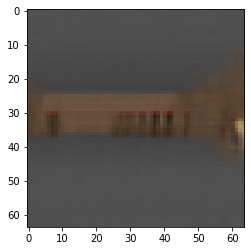

MORTO


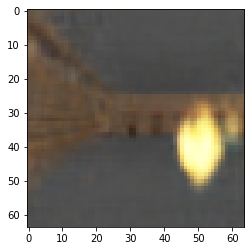

MORTO


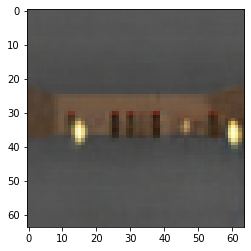

MORTO


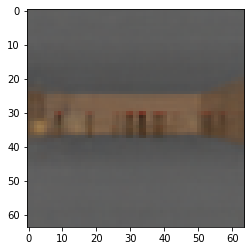

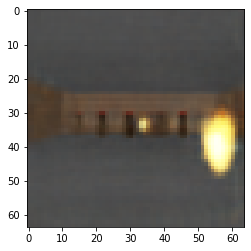

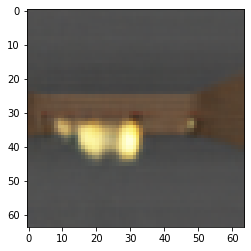

MORTO


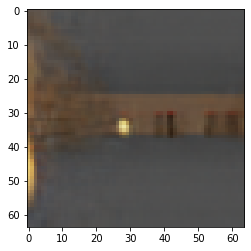

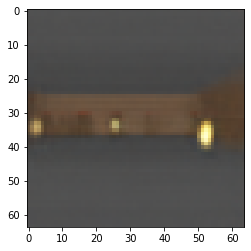

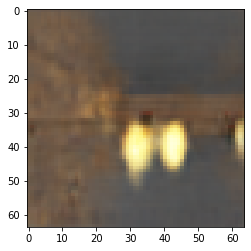

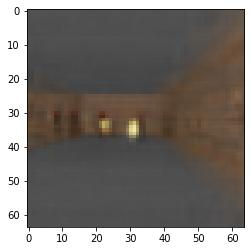

MORTO


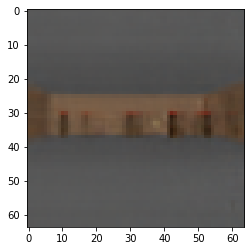

MORTO


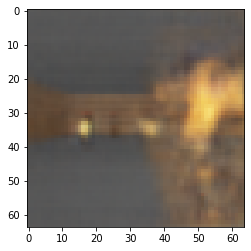

MORTO


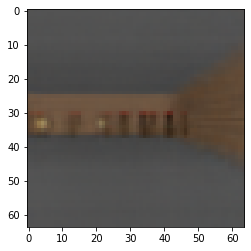

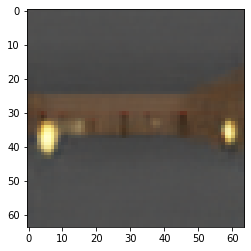

MORTO


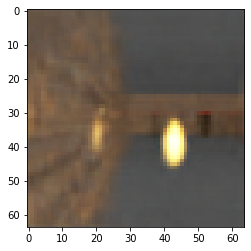

MORTO


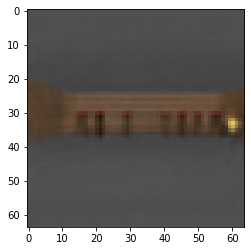

MORTO


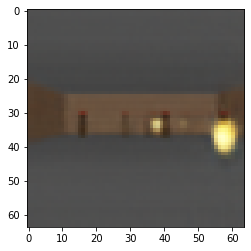

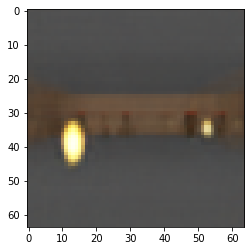

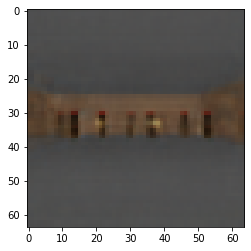

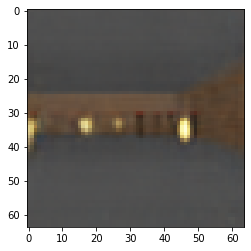

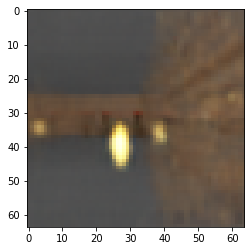

...

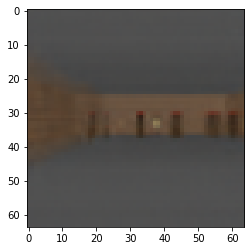

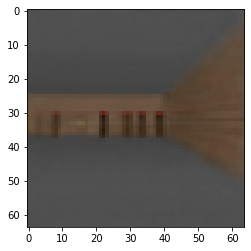

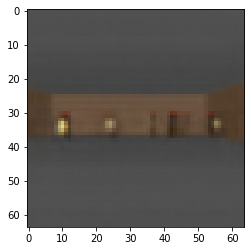

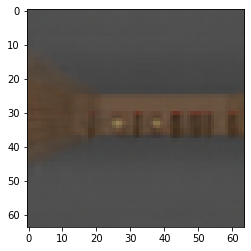

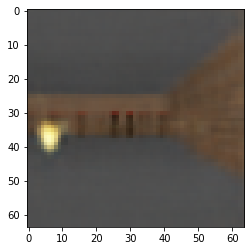

MORTO


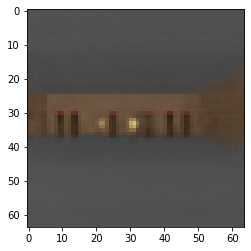

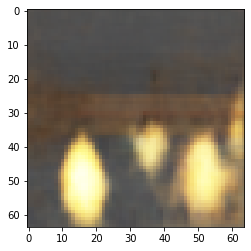

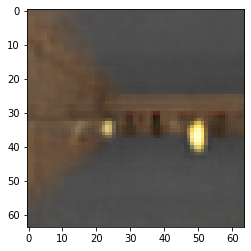

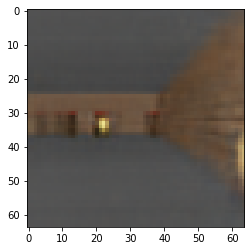

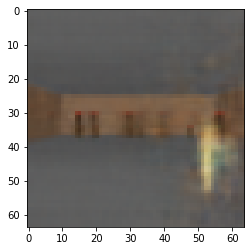

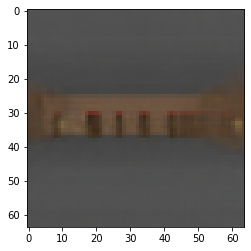

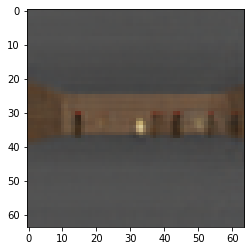

MORTO


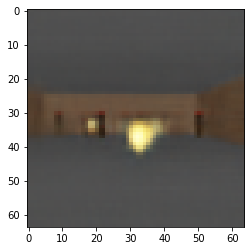

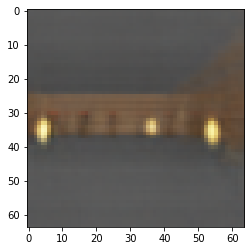

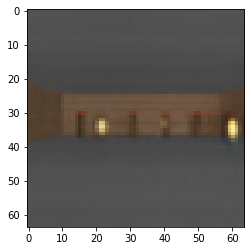

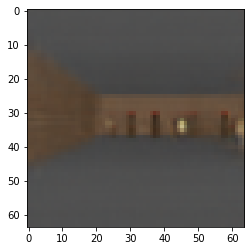

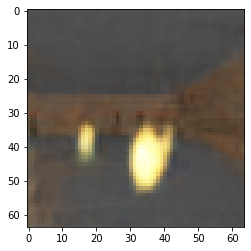

...

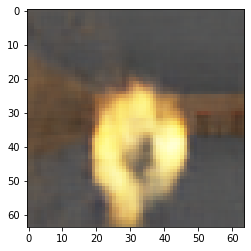

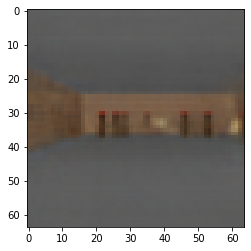

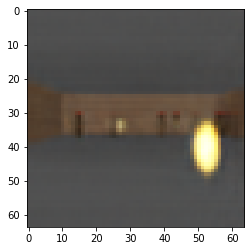

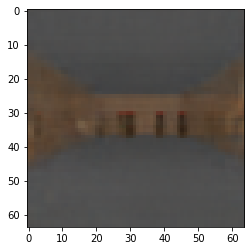

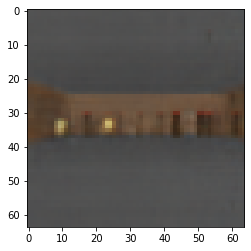

MORTO


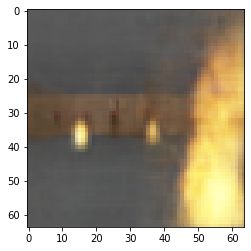

MORTO


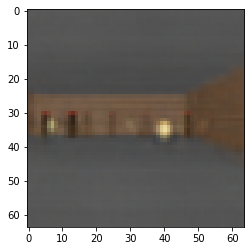

MORTO


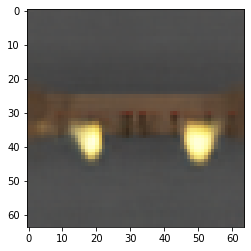

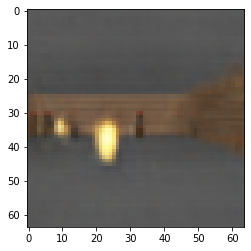

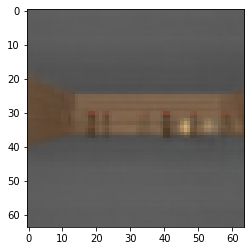

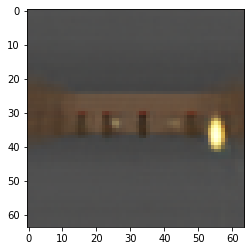

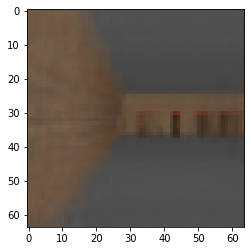

...

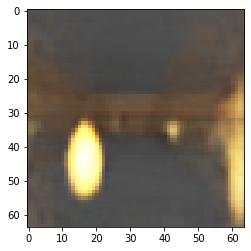

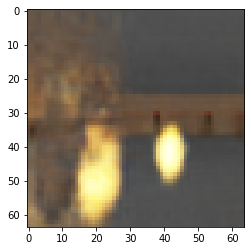

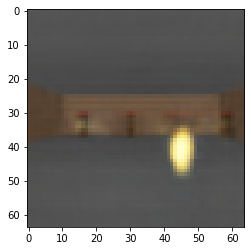

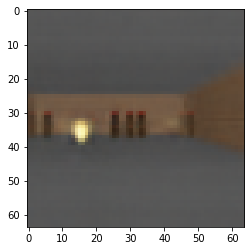

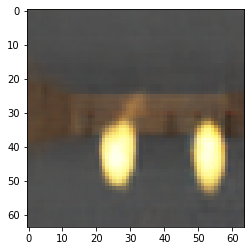

MORTO


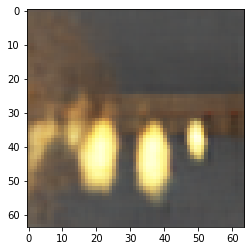

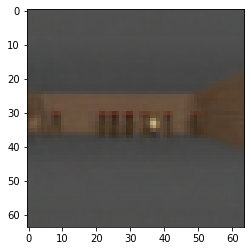

MORTO


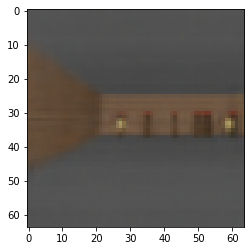

MORTO


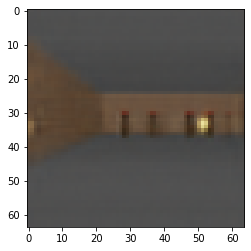

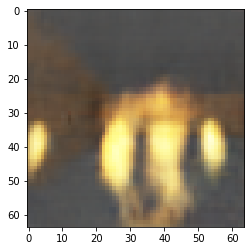

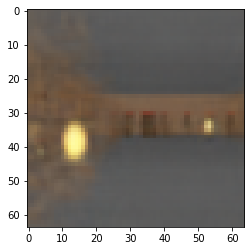

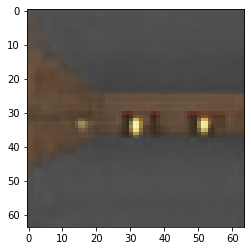

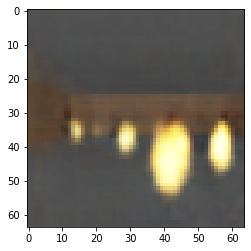

MORTO


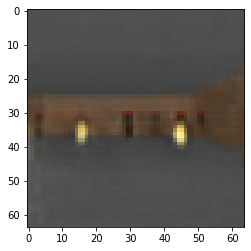

MORTO


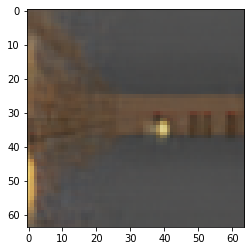

MORTO


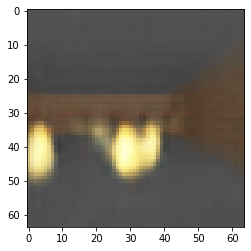

MORTO


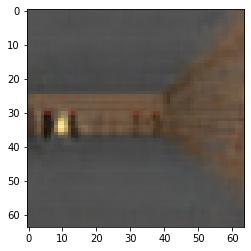

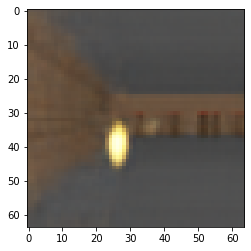

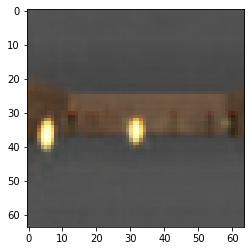

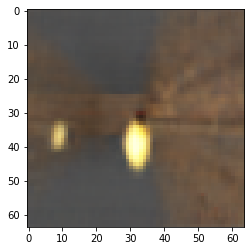

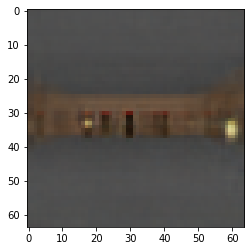

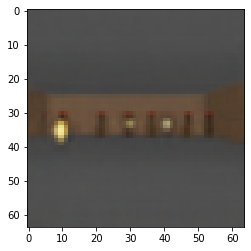

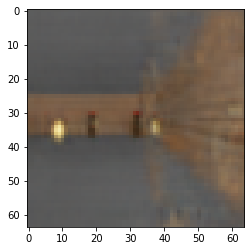

MORTO


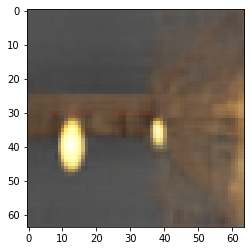

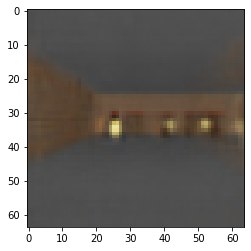

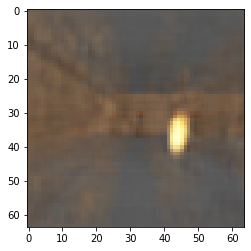

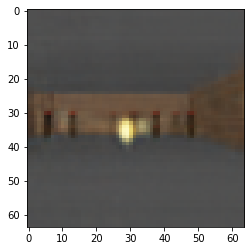

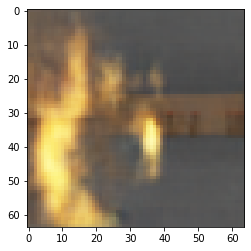

...

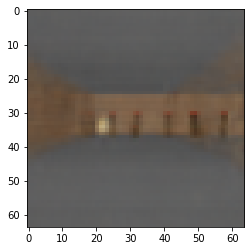

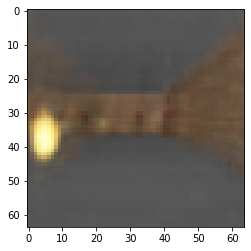

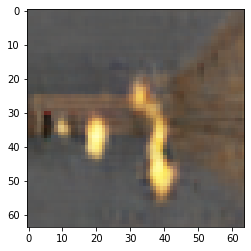

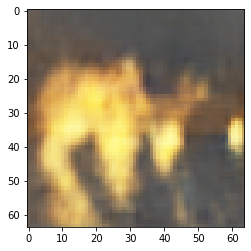

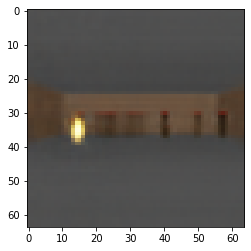

MORTO


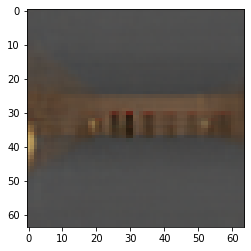

MORTO


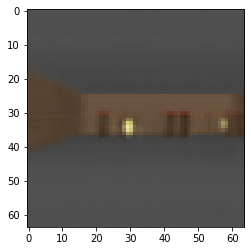

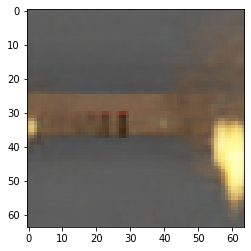

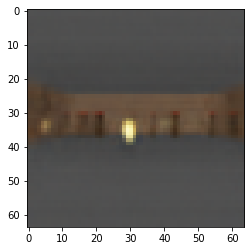

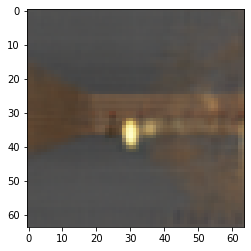

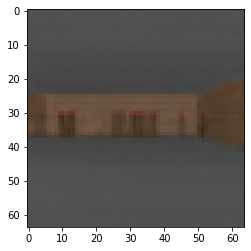

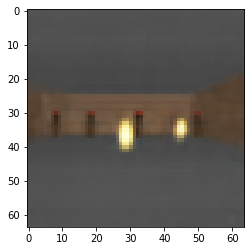

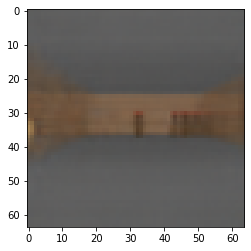

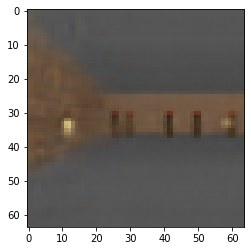

MORTO


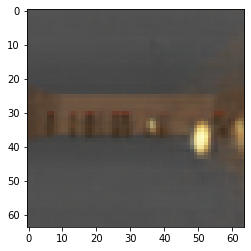

MORTO


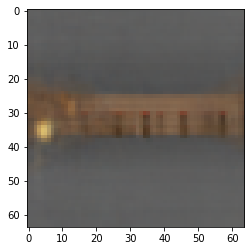

MORTO


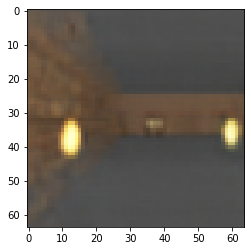

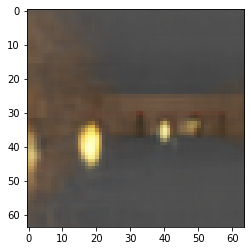

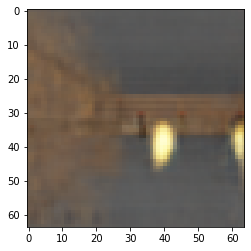

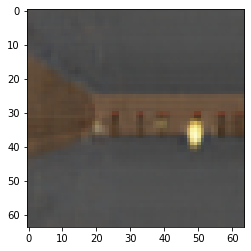

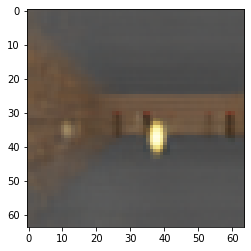

...

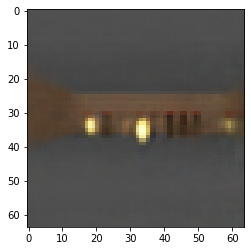

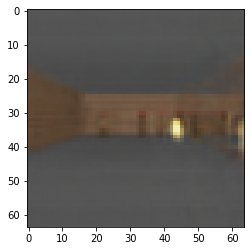

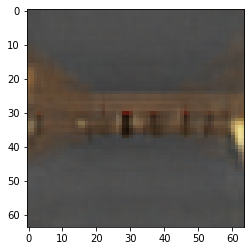

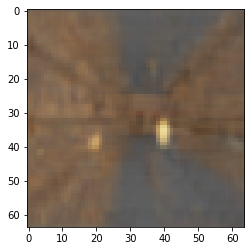

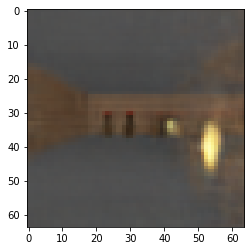

MORTO


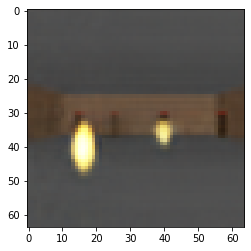

MORTO


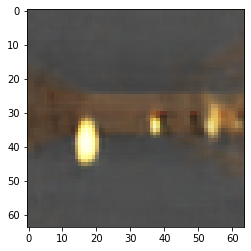

MORTO


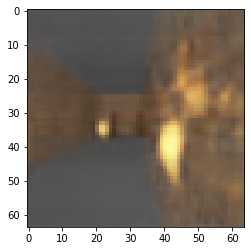

MORTO


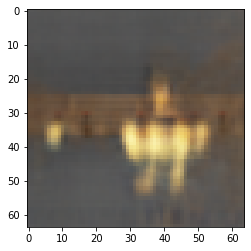

MORTO


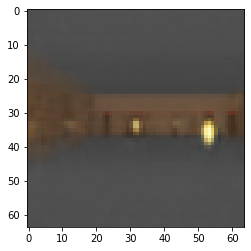

MORTO


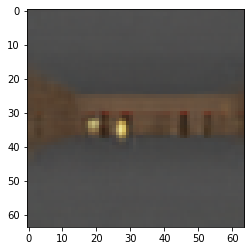

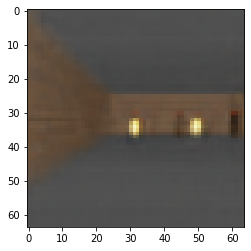

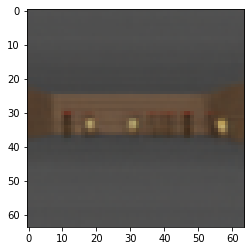

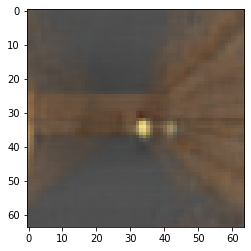

MORTO


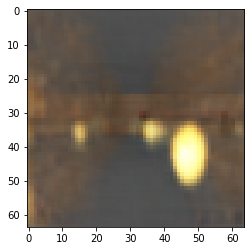

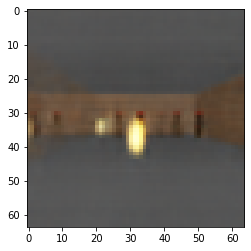

MORTO


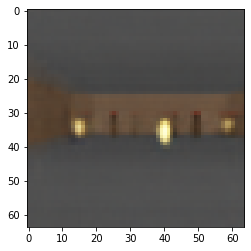

MORTO


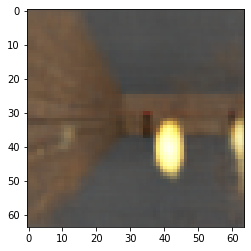

MORTO


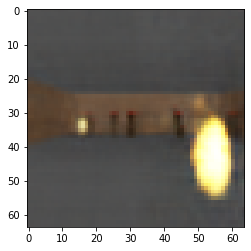

MORTO


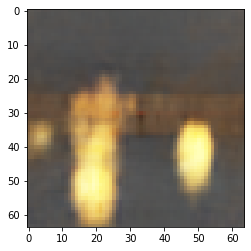

MORTO


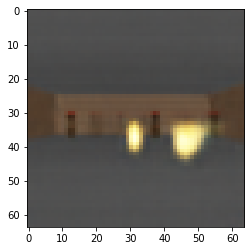

MORTO


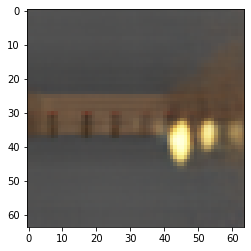

MORTO


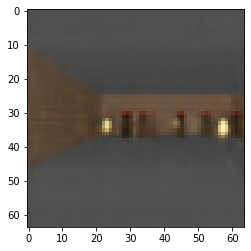

MORTO


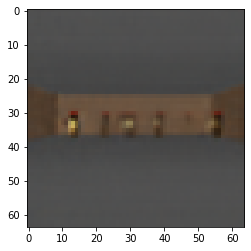

MORTO


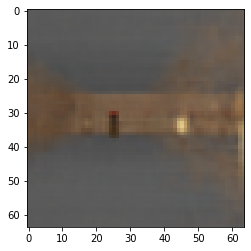

MORTO


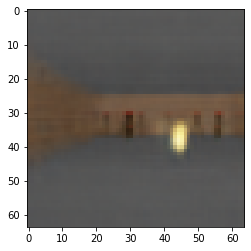

MORTO


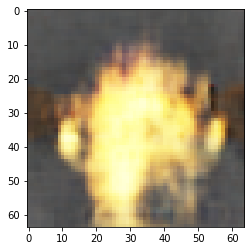

MORTO


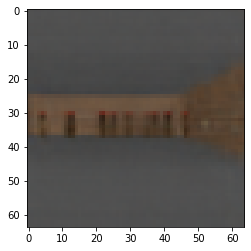

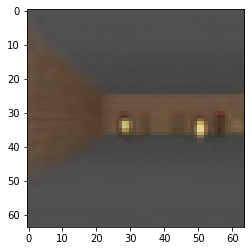

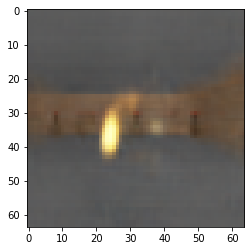

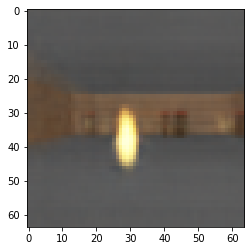

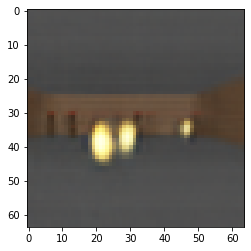

...

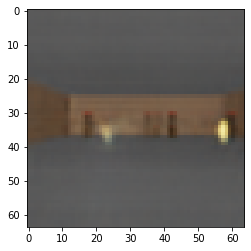

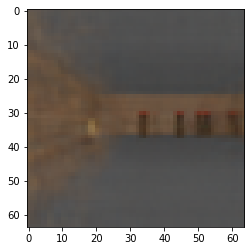

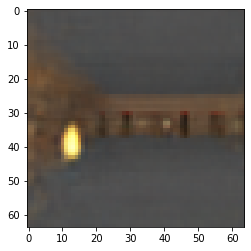

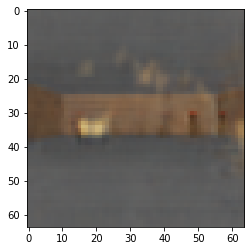

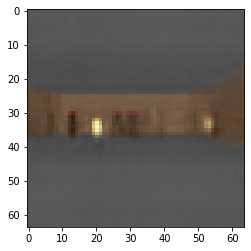

MORTO


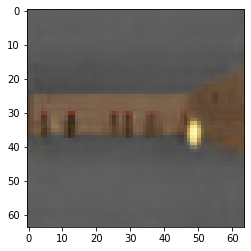

MORTO


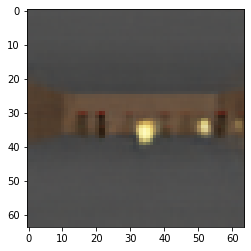

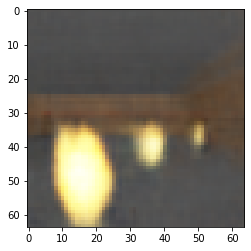

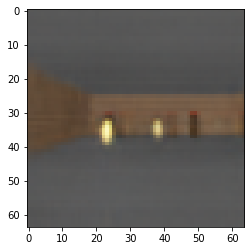

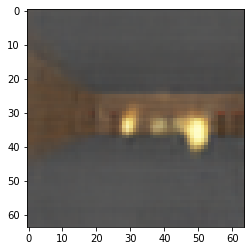

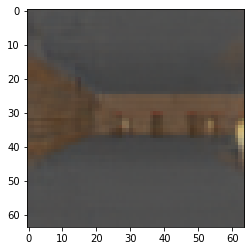

...

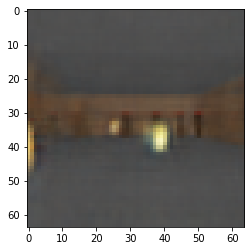

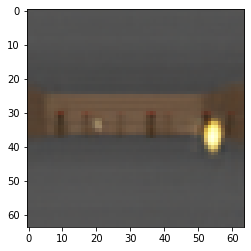

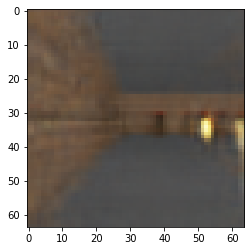

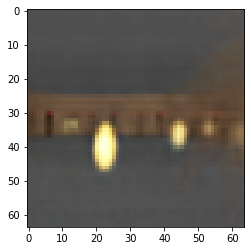

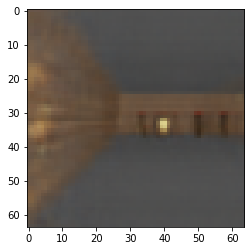

MORTO


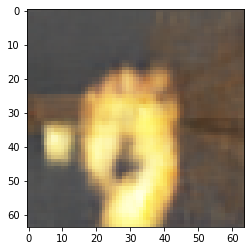

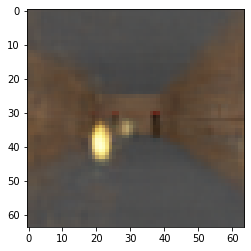

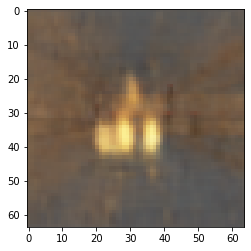

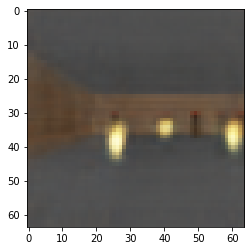

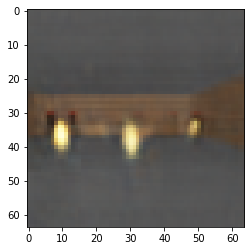

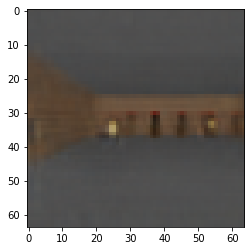

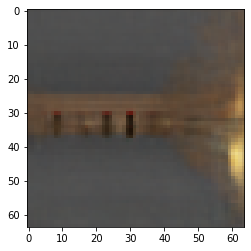

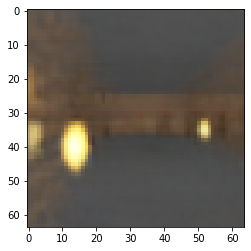

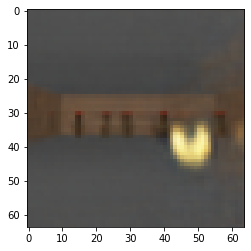

MORTO


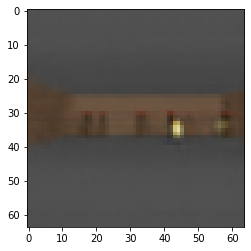

MORTO


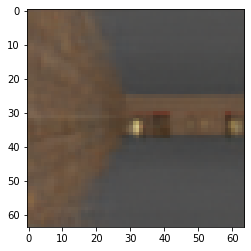

MORTO


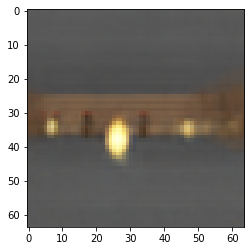

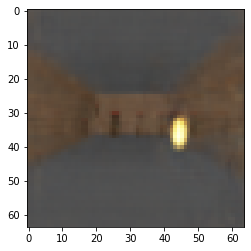

MORTO


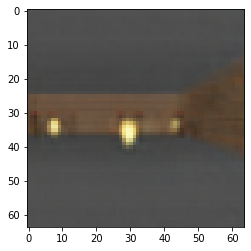

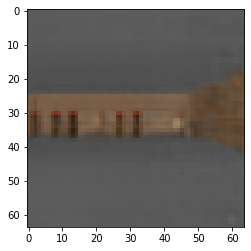

MORTO


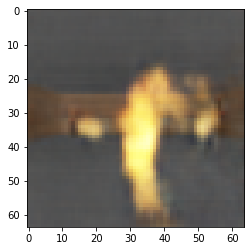

MORTO


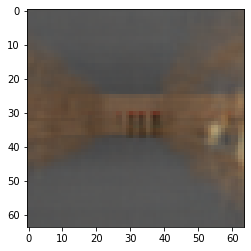

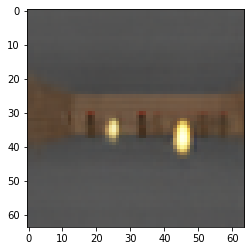

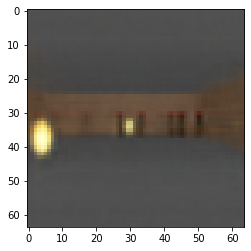

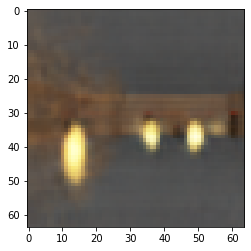

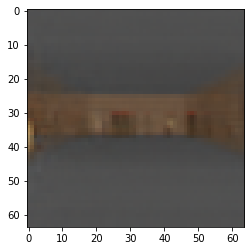

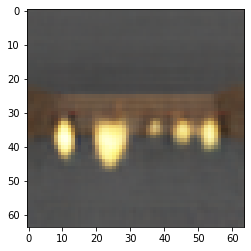

MORTO


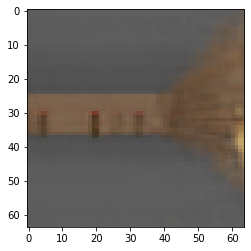

MORTO


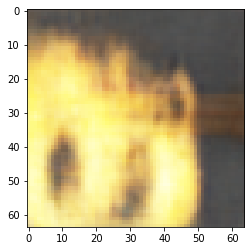

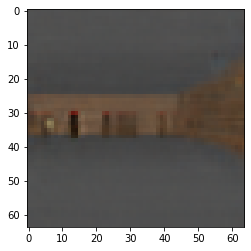

MORTO


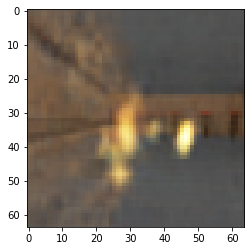

MORTO


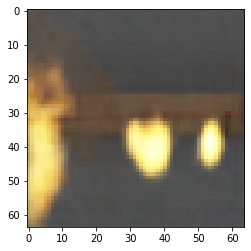

MORTO


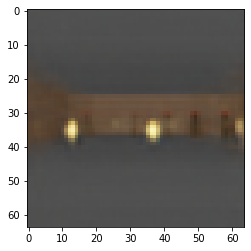

MORTO


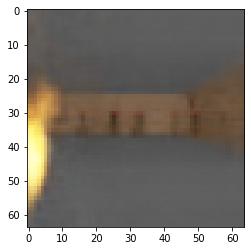

MORTO


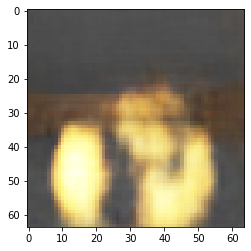

MORTO


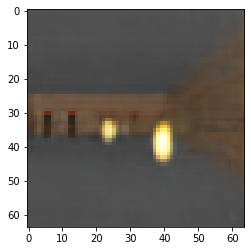

MORTO


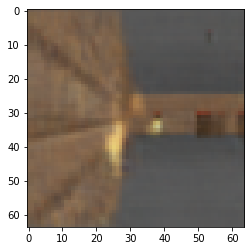

MORTO


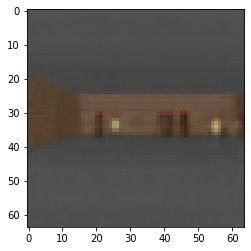

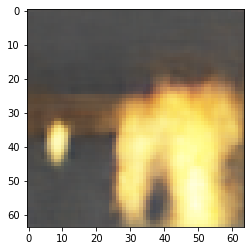

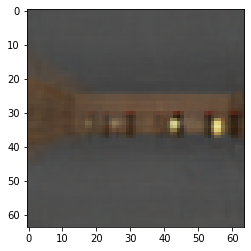

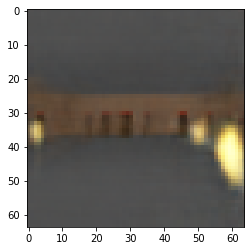

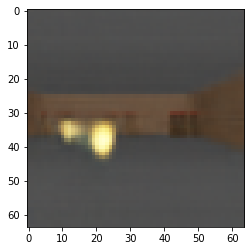

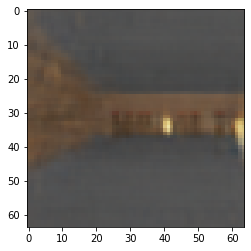

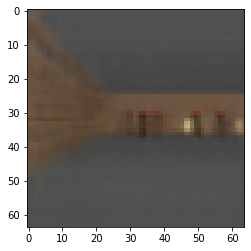

MORTO


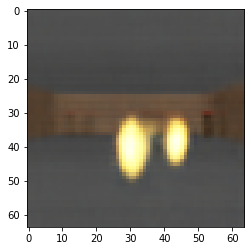

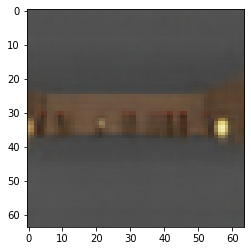

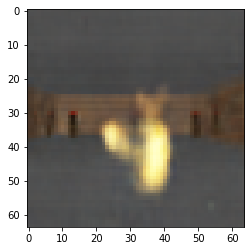

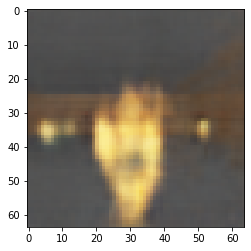

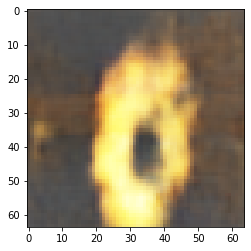

...

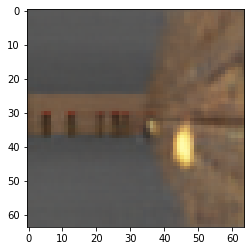

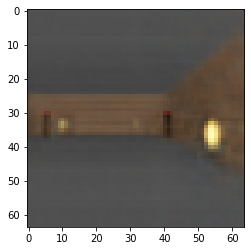

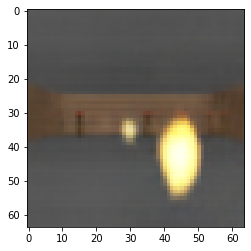

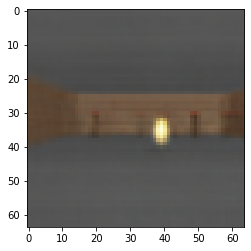

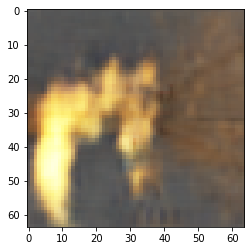

MORTO


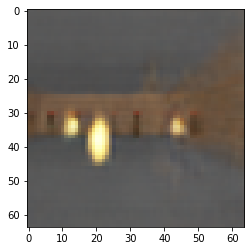

MORTO


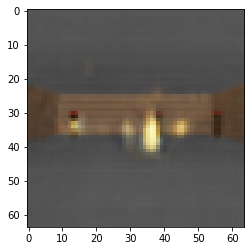

MORTO


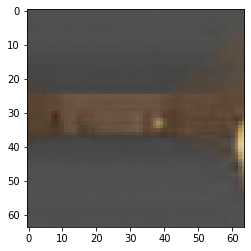

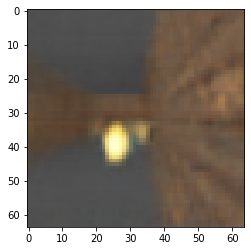

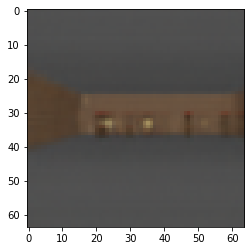

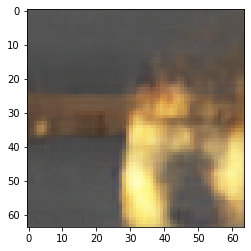

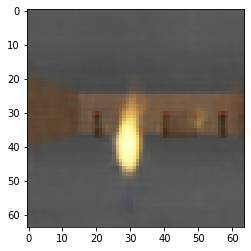

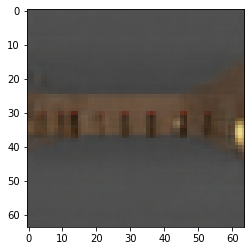

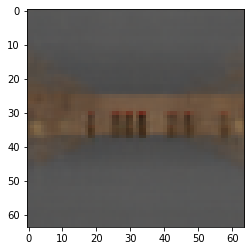

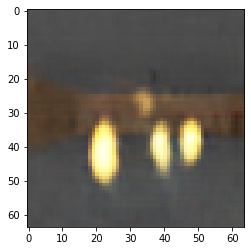

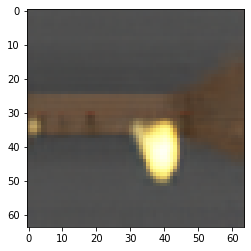

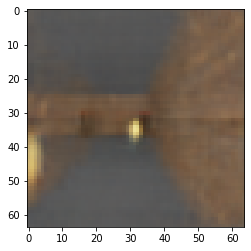

In [7]:
new_state,reward,done = learned_env.step(batch_encoded_frames[0][0][250],batch_actions[0][0][250],batch_reset[0][0][250])

for i in range(300):
    decoded = vae.decode_latent_vec(new_state)
    choosed_img = vae.post_process_frame(decoded)
    imgplot = plt.imshow(choosed_img)
    plt.show()
    new_state,reward,done = learned_env.step(new_state,batch_actions[0][0][i],done)
    if done:
        print("MORTO")
    i+=1


In [8]:
import imageio
from matplotlib import cm

images = []
for i in range(300):
    decoded = vae.decode_latent_vec(new_state)
    choosed_img = vae.post_process_frame(decoded)
    images.append(choosed_img)
    #imgplot = plt.imshow(choosed_img)
    #plt.show()
    new_state,reward,done = learned_env.step(new_state,batch_actions[0][0][i],done)
    if done:
        print("MORTO")
    i+=1
imageio.mimsave('dream.gif', images)

    


MORTO
MORTO
MORTO
MORTO


real done:  0  my done:  False
real done:  0  my done:  False
real done:  0  my done:  False
real done:  0  my done:  False


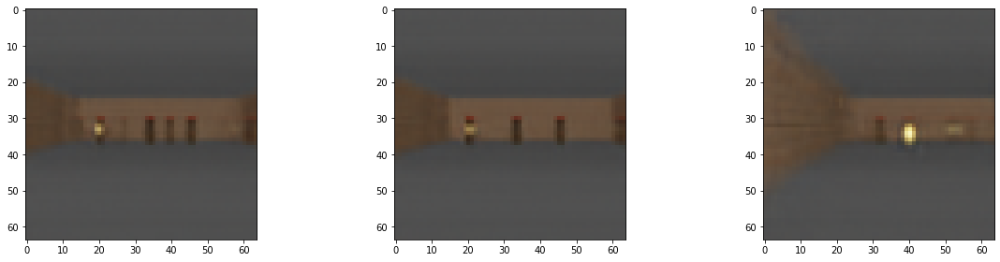

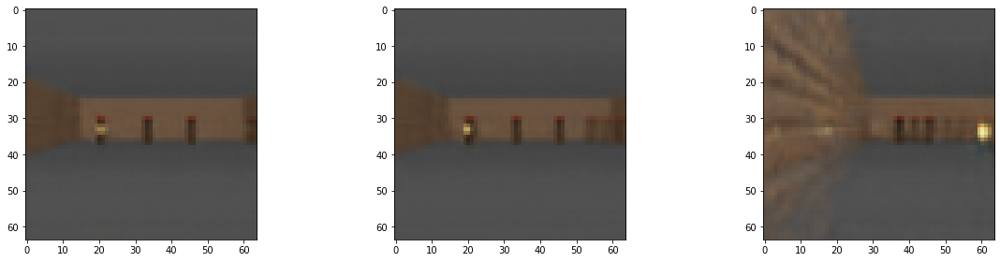

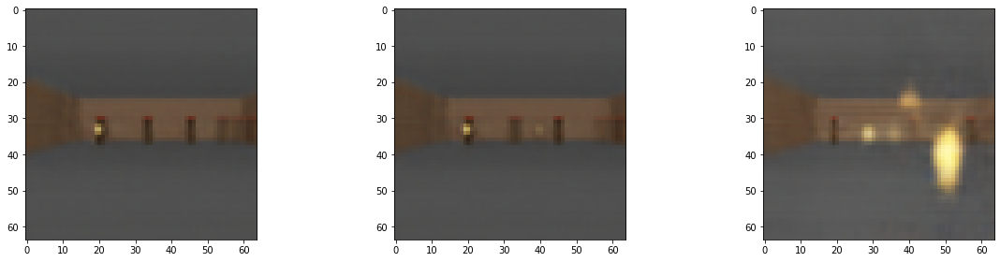

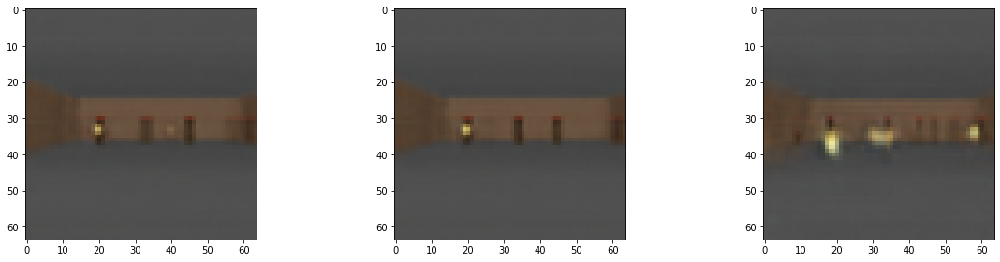

In [9]:
x = 330
for i in range(x,x+4):
    new_z,reward,done = learned_env.step(batch_encoded_frames[0][0][i],batch_actions[0][0][i],batch_reset[0][0][i])
    
    
    real_image = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i]))
    real_evolution = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i+1]))
    my_evolution = vae.post_process_frame(vae.decode_latent_vec(new_z))
    
    images = [real_image,real_evolution,my_evolution]
    print("real done: ", batch_reset[0][0][i+1], " my done: ", done)
    plt.figure(figsize=(20,10))
    columns = 3
    for i, image in enumerate(images):
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(image)
    i+=1

In [7]:
'''i = 10
new_z,reward,done = gen.step(batch_encoded_frames[0][0][i],batch_actions[0][0][i],batch_reset[0][0][i])
    
real_image = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i]))
real_evolution = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i+1]))
my_evolution = vae.post_process_frame(vae.decode_latent_vec(new_z))
    
images = [real_image,real_evolution,my_evolution]
plt.figure(figsize=(20,10))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)'''

'i = 10\nnew_z,reward,done = gen.step(batch_encoded_frames[0][0][i],batch_actions[0][0][i],batch_reset[0][0][i])\n    \nreal_image = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i]))\nreal_evolution = vae.post_process_frame(vae.decode_latent_vec(batch_encoded_frames[0][0][i+1]))\nmy_evolution = vae.post_process_frame(vae.decode_latent_vec(new_z))\n    \nimages = [real_image,real_evolution,my_evolution]\nplt.figure(figsize=(20,10))\ncolumns = 3\nfor i, image in enumerate(images):\n    plt.subplot(len(images) / columns + 1, columns, i + 1)\n    plt.imshow(image)'

In [8]:
'''pesca_immagine = 134

generated_sequence = learned_env.genetare_sequence(batch_encoded_frames[0][0][pesca_immagine])

print("Immagine di inizio")
new_state = batch_encoded_frames[0][0][pesca_immagine]
decoded = vae.decode_latent_vec(new_state)
choosed_img = vae.post_process_frame(decoded)
imgplot = plt.imshow(choosed_img)
plt.show()

print("Mia sequenza")
for i in range(len(generated_sequence)):
    new_state = generated_sequence[i]
    decoded = vae.decode_latent_vec(new_state)
    choosed_img = vae.post_process_frame(decoded)
    imgplot = plt.imshow(choosed_img)
    plt.show()'''

'pesca_immagine = 134\n\ngenerated_sequence = learned_env.genetare_sequence(batch_encoded_frames[0][0][pesca_immagine])\n\nprint("Immagine di inizio")\nnew_state = batch_encoded_frames[0][0][pesca_immagine]\ndecoded = vae.decode_latent_vec(new_state)\nchoosed_img = vae.post_process_frame(decoded)\nimgplot = plt.imshow(choosed_img)\nplt.show()\n\nprint("Mia sequenza")\nfor i in range(len(generated_sequence)):\n    new_state = generated_sequence[i]\n    decoded = vae.decode_latent_vec(new_state)\n    choosed_img = vae.post_process_frame(decoded)\n    imgplot = plt.imshow(choosed_img)\n    plt.show()'

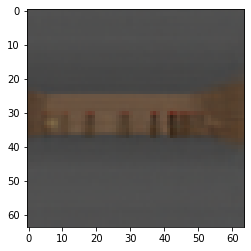

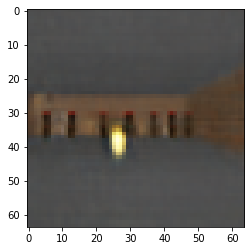

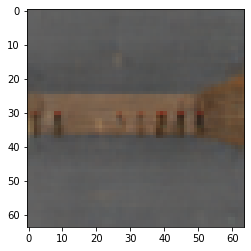

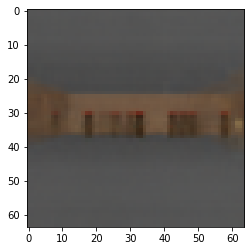

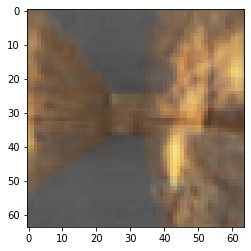

...

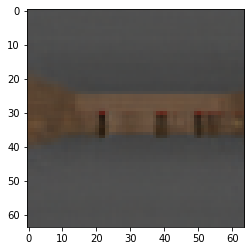

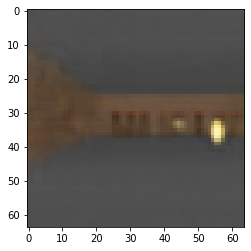

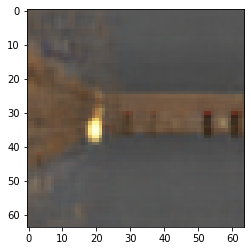

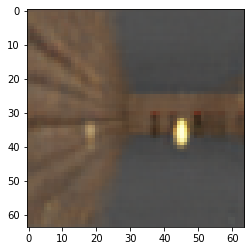

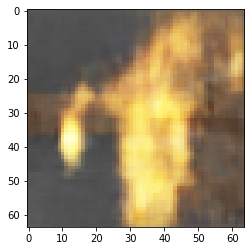

KeyboardInterrupt: 

In [10]:
#GIOCO NEL REAL ENV
i = 0
while 1:
    
    dec = vae.decode_latent_vec(batch_encoded_frames[0][0][i])
    img = vae.post_process_frame(dec)    
    imgplot = plt.imshow(img)
    plt.show()
    act = input()
    i+=1
    


Done:  False


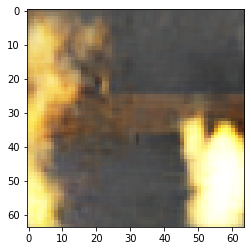


Done:  False


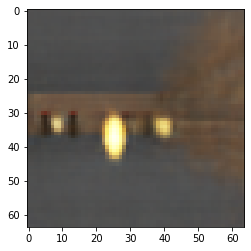


Done:  False


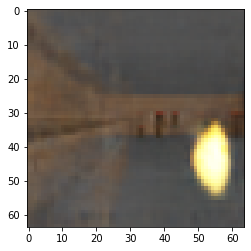


Done:  False


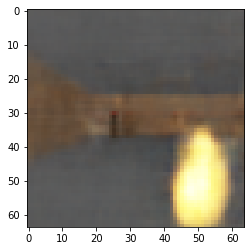


Done:  False


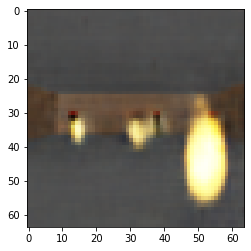


Done:  False


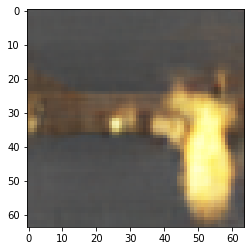


Done:  False


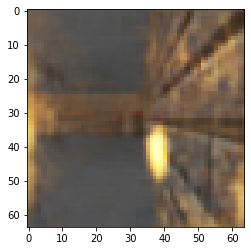


Done:  False


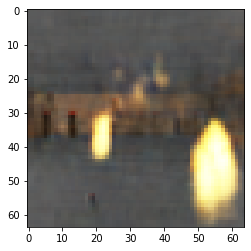


Done:  False


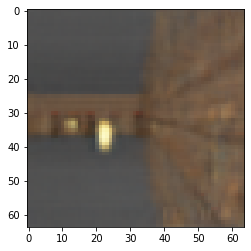


Done:  False


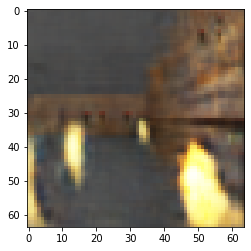


Done:  False


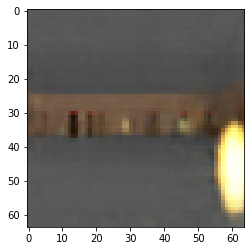


Done:  False


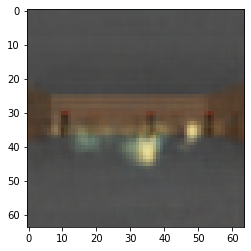


Done:  False


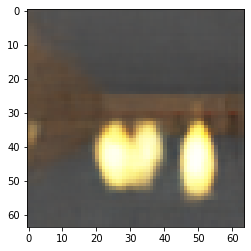


Done:  False


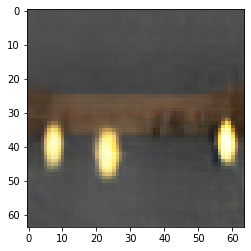


Done:  False


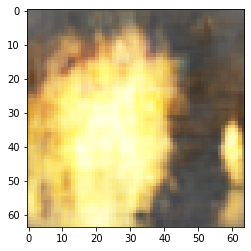


Done:  False


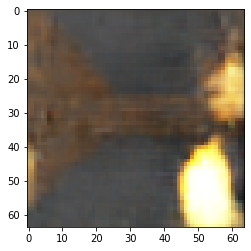


Done:  False


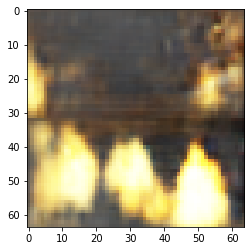


Done:  False


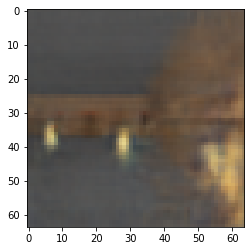


Done:  False


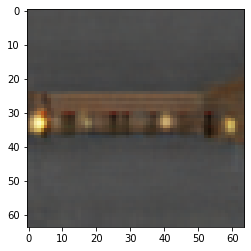


Done:  False


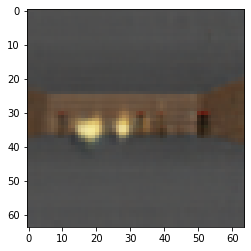


Done:  False


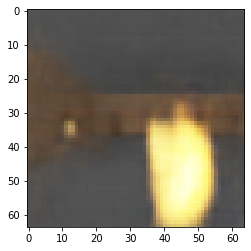


Done:  False


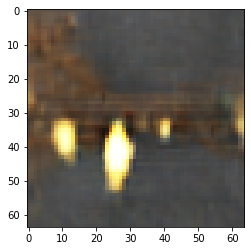


Done:  False


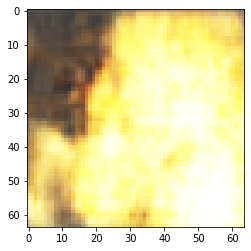


Done:  False


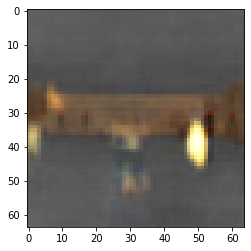


Done:  False


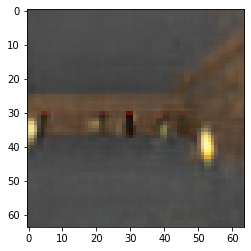


Done:  False


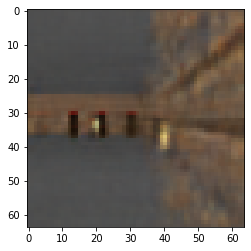


Done:  False


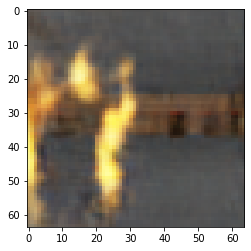


Done:  False


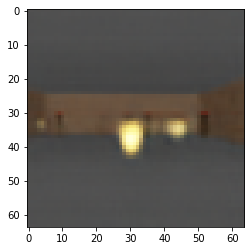


Done:  False


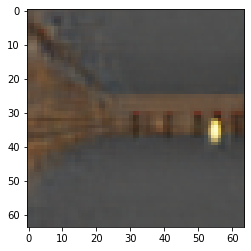


Done:  False


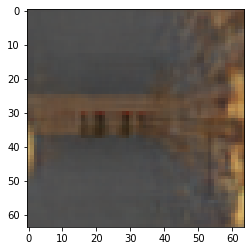


Done:  False


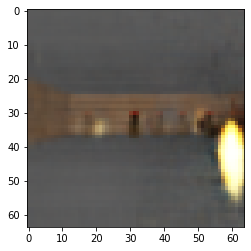


Done:  False


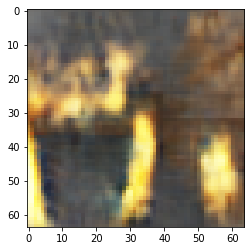


Done:  False


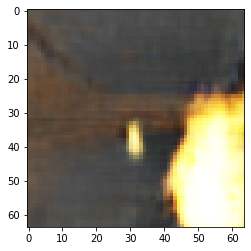


Done:  False


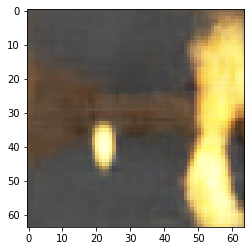


Done:  False


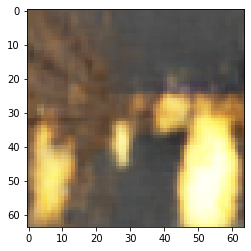


Done:  False


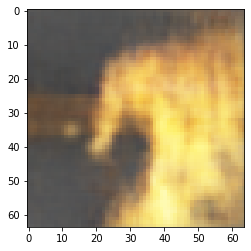


Done:  False


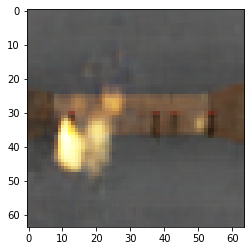

In [ ]:
#GIOCO NEL SIMULATED ENV
pesca_immagine = 134
learned_env.game(batch_encoded_frames[0][0][pesca_immagine])
